# Синтез изображений. Часть 2. Генеративно-Состязательная Сеть (GAN)

# Домашнее задание

## Реализовать синтезирование лиц с помощью DCGAN

Датасет отсюда: https://www.kaggle.com/gasgallo/faces-data-new?

Код адаптирован отсюда: https://github.com/jeffheaton/t81_558_deep_learning/blob/master/t81_558_class_07_2_Keras_gan.ipynb

In [ ]:
%tensorflow_version 2.x

In [ ]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 11450630357805927371, name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 11439961313930443233
 physical_device_desc: "device: XLA_CPU device", name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 14984346520139579632
 physical_device_desc: "device: XLA_GPU device", name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 15695549568
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 5161788978882722720
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"]

# Подключение библиотек

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense 
from tensorflow.keras.layers import Flatten, BatchNormalization
from tensorflow.keras.layers import Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
import numpy as np
from PIL import Image
from tqdm import tqdm
import os 
import time
import matplotlib.pyplot as plt
import glob

# Скачивание изображений

In [ ]:
# Загружаем токен из кагла в рабочий каталог (/content)

In [ ]:
# API key file надо обязательно закинуть в корневой каталог
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d gasgallo/faces-data-new

 89% 80.0M/89.9M [00:01<00:00, 50.7MB/s]
100% 89.9M/89.9M [00:01<00:00, 50.4MB/s]


In [ ]:
!unzip /content/faces-data-new.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: images/images/spletc.3.jpg  
  inflating: images/images/spletc.4.jpg  
  inflating: images/images/spletc.5.jpg  
  inflating: images/images/spletc.6.jpg  
  inflating: images/images/spletc.7.jpg  
  inflating: images/images/spletc.8.jpg  
  inflating: images/images/spletc.9.jpg  
  inflating: images/images/spyount.1.jpg  
  inflating: images/images/spyount.10.jpg  
  inflating: images/images/spyount.11.jpg  
  inflating: images/images/spyount.12.jpg  
  inflating: images/images/spyount.13.jpg  
  inflating: images/images/spyount.14.jpg  
  inflating: images/images/spyount.15.jpg  
  inflating: images/images/spyount.16.jpg  
  inflating: images/images/spyount.17.jpg  
  inflating: images/images/spyount.18.jpg  
  inflating: images/images/spyount.19.jpg  
  inflating: images/images/spyount.2.jpg  
  inflating: images/images/spyount.20.jpg  
  inflating: images/images/spyount.3.jpg  
  inflating: images/image

In [ ]:
#!rm -r images/images

In [ ]:
#os.listdir('/content/faces-data-new/images/')

# Задание параметров

In [ ]:
# Generation resolution - Must be square 
# Training data is also scaled to this.
# Note GENERATE_RES 4 or higher  
# will blow Google CoLab's memory and have not
# been tested extensivly.
GENERATE_RES = 3 # Generation resolution factor 
# (1=32, 2=64, 3=96, 4=128, etc.)
GENERATE_SQUARE = 32 * GENERATE_RES # rows/cols (should be square)
IMAGE_CHANNELS = 3

# Preview image 
PREVIEW_ROWS = 4
PREVIEW_COLS = 7
PREVIEW_MARGIN = 16

# Size vector to generate images from
SEED_SIZE = 100

# Configuration
DATA_PATH = '/content/out_photo'
EPOCHS = 50
BATCH_SIZE = 32
BUFFER_SIZE = 60000

print(f"Will generate {GENERATE_SQUARE}px square images.")

Will generate 96px square images.


In [ ]:
# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

# Формирование пайплайна данных

In [ ]:
data = []
data_root = '/content/images/'
for fpath in glob.glob(os.path.join(data_root, '*.jpg')):
  data.append(fpath)

In [ ]:
def load_n_proc_img(item):
  # Здесь item - путь до фотки, который в бинарном формате завернут в тензор
  image = tf.io.read_file(item)
  image = tf.image.decode_image(image)
  image = (tf.dtypes.cast(image, tf.float32) - 127.5)/127.5
  image = tf.image.resize(image, [GENERATE_SQUARE, GENERATE_SQUARE])
  return image

def item_to_video(item):
  video = tf.py_function(load_n_proc_img, [item], [tf.float32])
  return video

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices(data)
train_dataset = train_dataset.map(item_to_video)
#train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
samples = iter(train_dataset)
sample = samples.next()
sample[0].shape

TensorShape([32, 96, 96, 3])

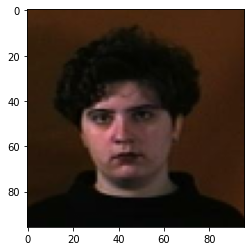

In [ ]:
plt.imshow((sample[0][10, ..., :]+ 1.0) / 2.0)

# Определение генератора и дискриминатора

In [ ]:
def build_generator(seed_size, channels):
    model = Sequential()

    model.add(Dense(4*4*256,activation="relu",input_dim=seed_size))
    model.add(Reshape((4,4,256)))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
   
    # Output resolution, additional upsampling
    model.add(UpSampling2D())
    model.add(Conv2D(128,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    if GENERATE_RES>1:
      model.add(UpSampling2D(size=(GENERATE_RES,GENERATE_RES)))
      model.add(Conv2D(128,kernel_size=3,padding="same"))
      model.add(BatchNormalization(momentum=0.8))
      model.add(Activation("relu"))

    # Final CNN layer
    model.add(Conv2D(channels,kernel_size=3,padding="same"))
    model.add(Activation("tanh"))

    return model


def build_discriminator(image_shape):
    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=image_shape, 
                     padding="same"))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

# Алгоритм сохранения результата

In [ ]:
def save_images(cnt, noise):
  image_array = np.full(( 
      PREVIEW_MARGIN + (PREVIEW_ROWS * (GENERATE_SQUARE+PREVIEW_MARGIN)), 
      PREVIEW_MARGIN + (PREVIEW_COLS * (GENERATE_SQUARE+PREVIEW_MARGIN)), 3), 
      255, dtype=np.uint8)
  
  generated_images = generator.predict(noise)

  generated_images = 0.5 * generated_images + 0.5

  image_count = 0
  for row in range(PREVIEW_ROWS):
      for col in range(PREVIEW_COLS):
        r = row * (GENERATE_SQUARE+16) + PREVIEW_MARGIN
        c = col * (GENERATE_SQUARE+16) + PREVIEW_MARGIN
        image_array[r:r+GENERATE_SQUARE,c:c+GENERATE_SQUARE] \
            = generated_images[image_count] * 255
        image_count += 1

          
  output_path = os.path.join(DATA_PATH,'output')
  if not os.path.exists(output_path):
    os.makedirs(output_path)
  
  filename = os.path.join(output_path,f"train-{cnt}.png")
  im = Image.fromarray(image_array)
  im.save(filename)

# Алгоритм вывода в процессе обучения

In [ ]:
def plot_images(samples):
    fig = plt.figure(figsize=(20, 20))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(8, 8, j+1)
        #ax.imshow(samples[j, ...,0], cmap='gray') # для серого в диапазоне [0; 1]
        #ax.imshow((samples[j, ...,:]) # для цветного в диапазоне [0; 1]
        ax.imshow((samples[j, ...,:] + 1.0) / 2.0)  # для цветного в диапазоне [-1; 1]
        plt.xticks([]), plt.yticks([])
    plt.show()

# Пример работы генератора и дискриминатора

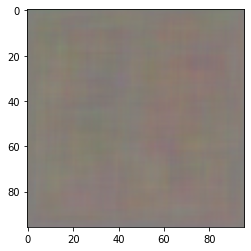

In [ ]:
generator = build_generator(SEED_SIZE, IMAGE_CHANNELS)

noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)

plt.imshow((generated_image[0, :, :, :] + 1.0) / 2.0)

In [ ]:
image_shape = (GENERATE_SQUARE,GENERATE_SQUARE,IMAGE_CHANNELS)

discriminator = build_discriminator(image_shape)
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.5005456]], shape=(1, 1), dtype=float32)


# Определение функций потерь и оптимизаторов

In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1.5e-4,0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1.5e-4,0.5)

# Обучение GAN

In [ ]:

# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(seed, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)
    

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  return gen_loss,disc_loss

In [ ]:
def train(dataset, epochs):
  fixed_seed = np.random.normal(0, 1, (PREVIEW_ROWS * PREVIEW_COLS, SEED_SIZE))
  start = time.time()

  for epoch in range(epochs):
    epoch_start = time.time()

    gen_loss_list = []
    disc_loss_list = []

    for image_batch in dataset:
      t = train_step(image_batch)
      gen_loss_list.append(t[0])
      disc_loss_list.append(t[1])

    g_loss = sum(gen_loss_list) / len(gen_loss_list)
    d_loss = sum(disc_loss_list) / len(disc_loss_list)

    epoch_elapsed = time.time()-epoch_start
    print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss}, {hms_string(epoch_elapsed)}')
    save_images(epoch, fixed_seed)

    # Вывод картинок
    noise = tf.random.normal([6, SEED_SIZE])
    generated_image = generator(noise, training=False)
    plot_images(generated_image)

  elapsed = time.time()-start
  print (f'Training time: {hms_string(elapsed)}')

Epoch 1, gen loss=0.6565090417861938,disc loss=1.1907521486282349, 0:00:32.68


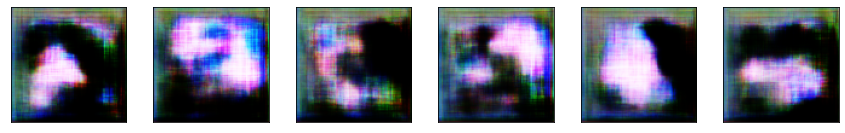

Epoch 2, gen loss=0.6762982606887817,disc loss=1.1894348859786987, 0:00:29.43


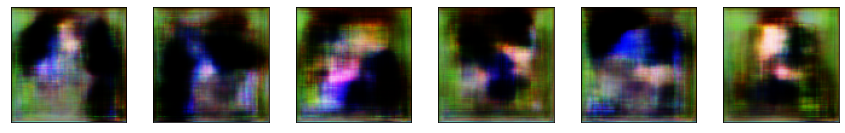

Epoch 3, gen loss=0.6803549528121948,disc loss=1.2112897634506226, 0:00:29.53


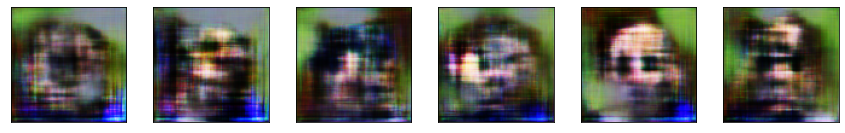

Epoch 4, gen loss=0.67692631483078,disc loss=1.2312510013580322, 0:00:29.31


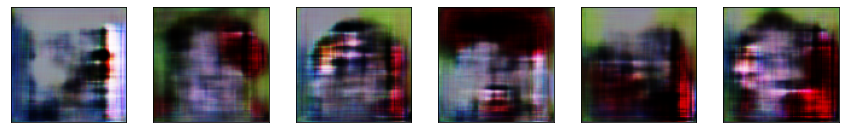

Epoch 5, gen loss=0.6820189356803894,disc loss=1.2119139432907104, 0:00:29.45


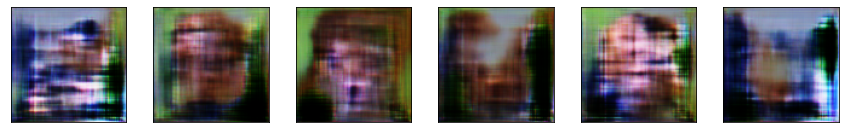

Epoch 6, gen loss=0.6815020442008972,disc loss=1.208217978477478, 0:00:30.21


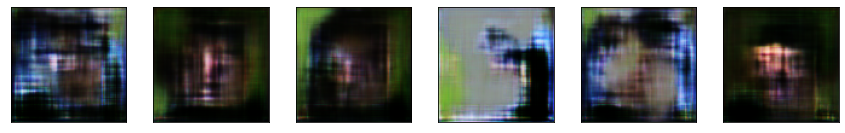

Epoch 7, gen loss=0.6841560006141663,disc loss=1.2034538984298706, 0:00:29.72


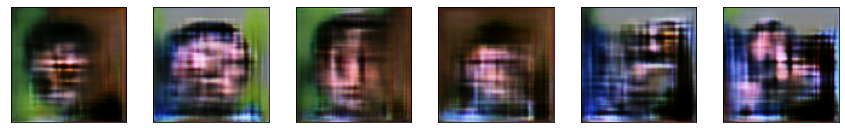

Epoch 8, gen loss=0.6857288479804993,disc loss=1.2092968225479126, 0:00:29.68


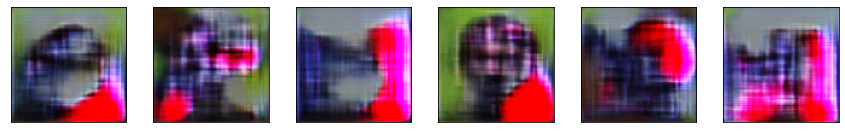

Epoch 9, gen loss=0.6891461610794067,disc loss=1.1845768690109253, 0:00:29.87


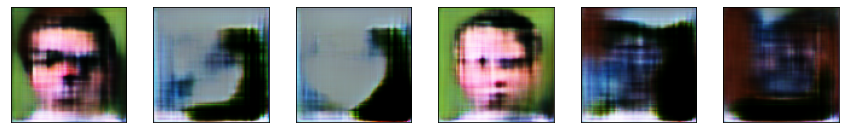

Epoch 10, gen loss=0.6790355443954468,disc loss=1.2206188440322876, 0:00:29.59


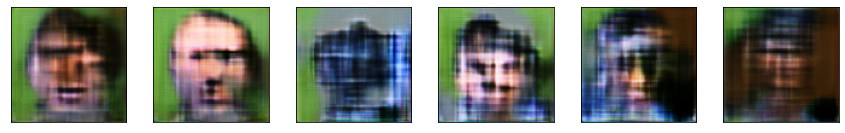

Epoch 11, gen loss=0.672253429889679,disc loss=1.1812957525253296, 0:00:29.66


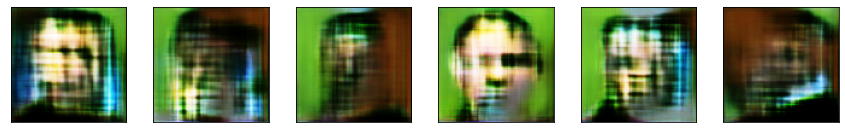

Epoch 12, gen loss=0.6699067950248718,disc loss=1.0960195064544678, 0:00:29.51


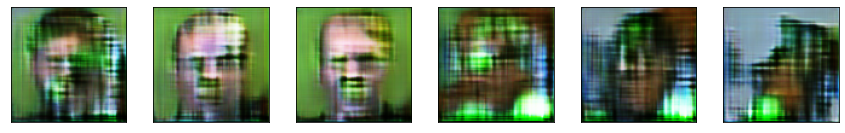

Epoch 13, gen loss=0.6731255054473877,disc loss=1.2328178882598877, 0:00:29.34


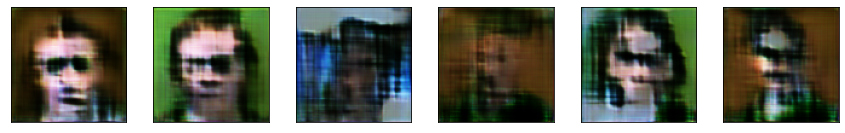

Epoch 14, gen loss=0.6882129907608032,disc loss=1.3123161792755127, 0:00:29.39


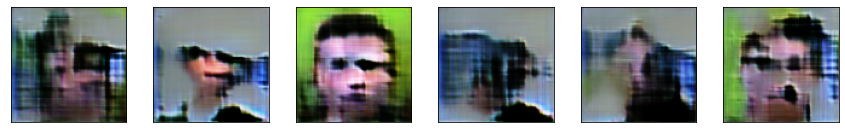

Epoch 15, gen loss=0.6562889814376831,disc loss=1.1538217067718506, 0:00:29.13


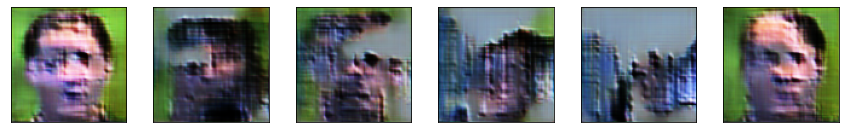

Epoch 16, gen loss=0.6716784238815308,disc loss=1.0852513313293457, 0:00:29.22


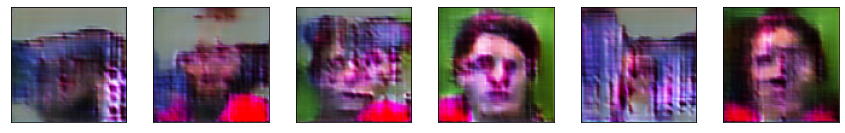

Epoch 17, gen loss=0.6931349635124207,disc loss=1.0065447092056274, 0:00:29.85


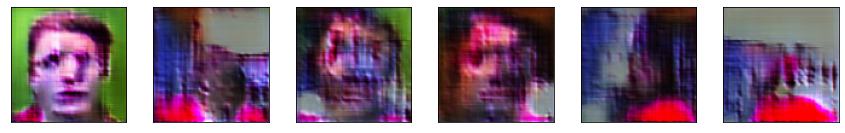

Epoch 18, gen loss=0.6931325197219849,disc loss=1.006469488143921, 0:00:29.21


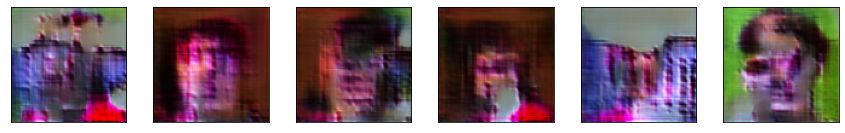

Epoch 19, gen loss=0.6773419976234436,disc loss=1.0669130086898804, 0:00:29.60


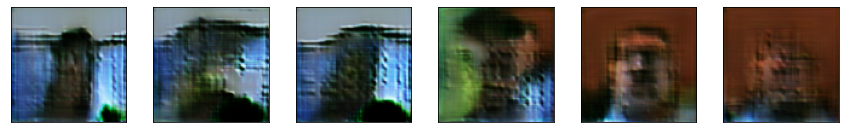

Epoch 20, gen loss=0.6736794710159302,disc loss=1.0725706815719604, 0:00:29.19


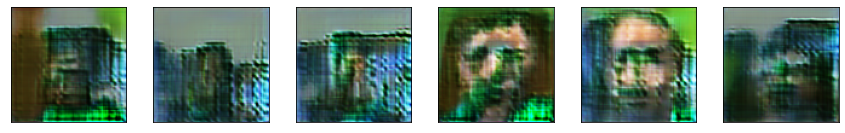

Epoch 21, gen loss=0.6749497652053833,disc loss=1.0781660079956055, 0:00:29.22


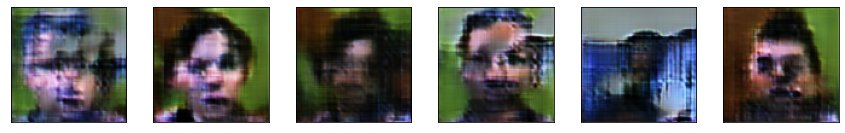

Epoch 22, gen loss=0.6725577116012573,disc loss=1.0802127122879028, 0:00:29.31


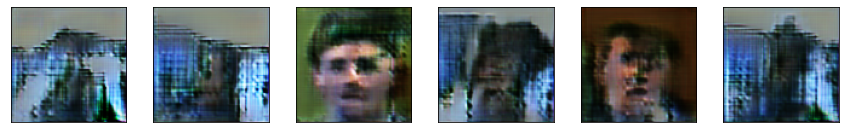

Epoch 23, gen loss=0.6683701276779175,disc loss=1.087160587310791, 0:00:29.35


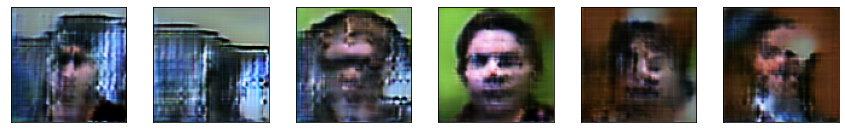

Epoch 24, gen loss=0.6677241325378418,disc loss=1.0866847038269043, 0:00:29.29


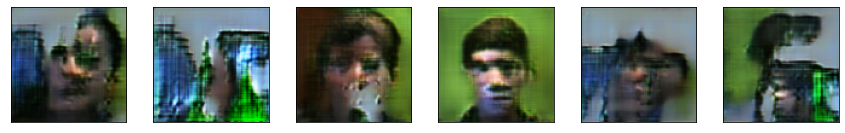

Epoch 25, gen loss=0.6795778274536133,disc loss=1.0522371530532837, 0:00:29.56


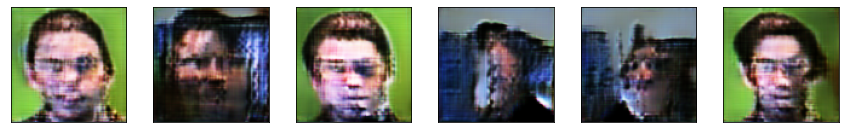

Epoch 26, gen loss=0.6874106526374817,disc loss=1.0249906778335571, 0:00:29.48


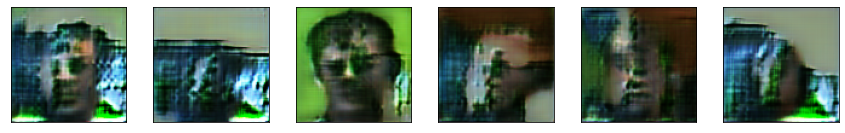

Epoch 27, gen loss=0.6931436657905579,disc loss=1.006430983543396, 0:00:30.27


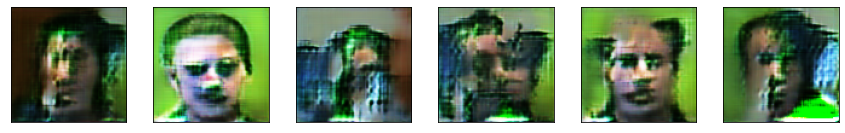

Epoch 28, gen loss=0.6825076937675476,disc loss=1.0405875444412231, 0:00:29.45


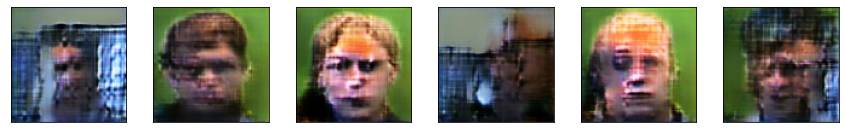

Epoch 29, gen loss=0.6758856773376465,disc loss=1.0663999319076538, 0:00:29.71


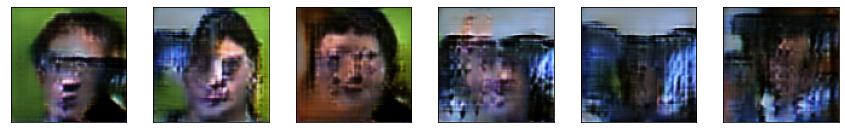

Epoch 30, gen loss=0.6763386130332947,disc loss=1.0592381954193115, 0:00:29.59


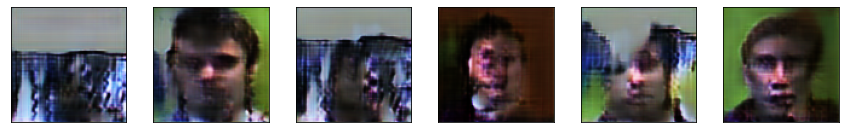

Epoch 31, gen loss=0.676948070526123,disc loss=1.0587726831436157, 0:00:29.48


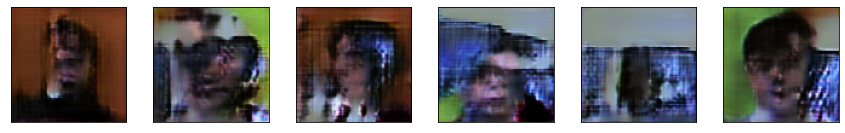

Epoch 32, gen loss=0.6867967844009399,disc loss=1.0281405448913574, 0:00:29.53


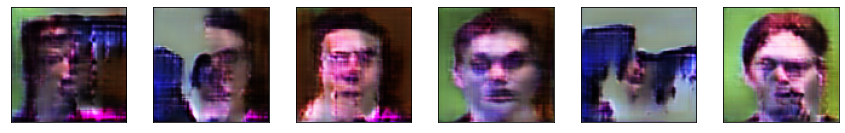

Epoch 33, gen loss=0.681758463382721,disc loss=1.0741890668869019, 0:00:29.58


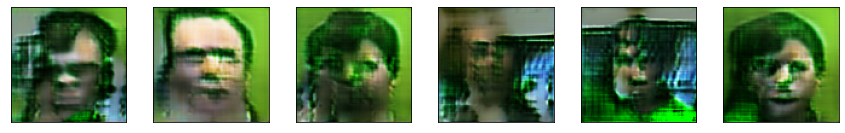

Epoch 34, gen loss=0.6778534650802612,disc loss=1.0539212226867676, 0:00:29.49


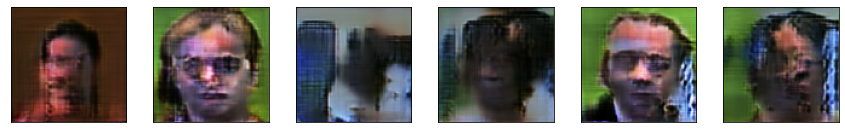

Epoch 35, gen loss=0.6813184022903442,disc loss=1.0442273616790771, 0:00:29.61


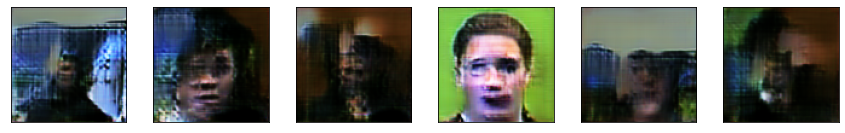

Epoch 36, gen loss=0.6811521053314209,disc loss=1.0423073768615723, 0:00:29.51


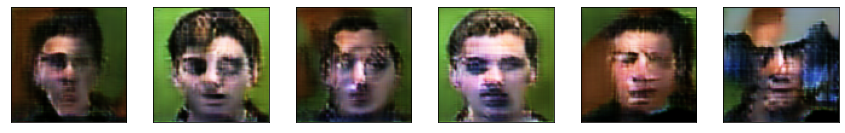

Epoch 37, gen loss=0.6820041537284851,disc loss=1.0397398471832275, 0:00:29.71


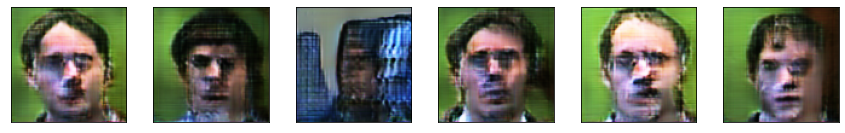

Epoch 38, gen loss=0.6898801922798157,disc loss=1.0167999267578125, 0:00:29.92


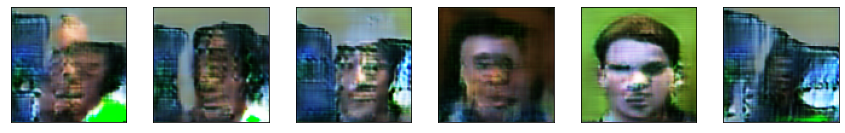

Epoch 39, gen loss=0.6931384205818176,disc loss=1.006416916847229, 0:00:29.73


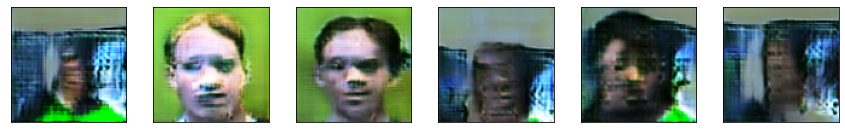

Epoch 40, gen loss=0.6931450963020325,disc loss=1.0064120292663574, 0:00:29.48


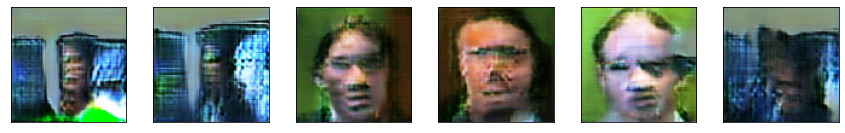

Epoch 41, gen loss=0.6899717450141907,disc loss=1.018343448638916, 0:00:29.69


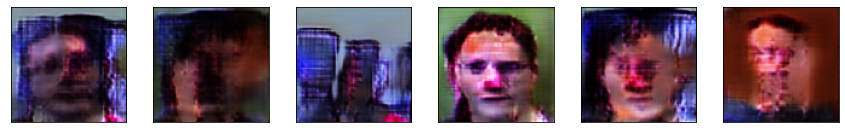

Epoch 42, gen loss=0.6931034922599792,disc loss=1.0065383911132812, 0:00:29.55


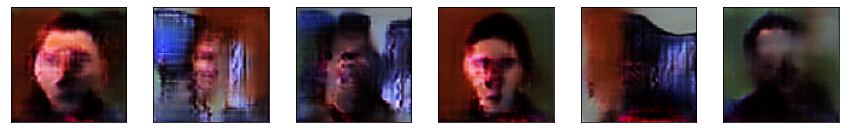

Epoch 43, gen loss=0.6931421160697937,disc loss=1.0064234733581543, 0:00:29.52


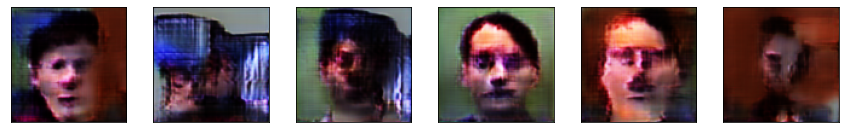

Epoch 44, gen loss=0.693142831325531,disc loss=1.0064131021499634, 0:00:29.48


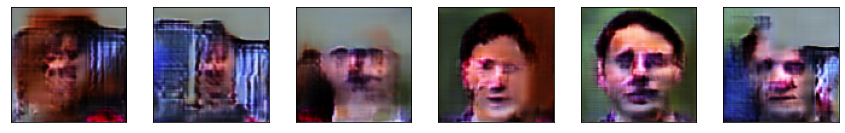

Epoch 45, gen loss=0.6918643712997437,disc loss=1.0163631439208984, 0:00:29.49


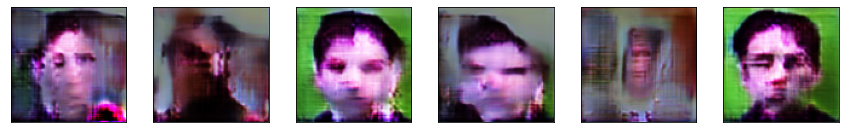

Epoch 46, gen loss=0.6920377612113953,disc loss=1.0117995738983154, 0:00:29.78


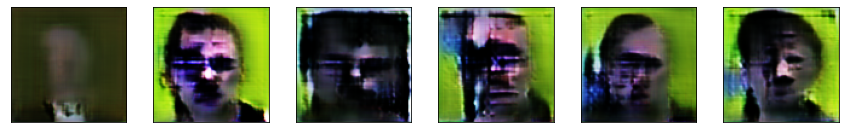

Epoch 47, gen loss=0.6931419968605042,disc loss=1.0064133405685425, 0:00:29.47


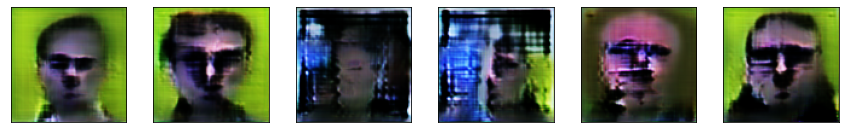

Epoch 48, gen loss=0.6931357383728027,disc loss=1.0064326524734497, 0:00:30.23


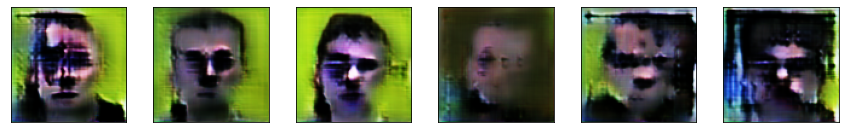

Epoch 49, gen loss=0.6930742859840393,disc loss=1.006730318069458, 0:00:29.58


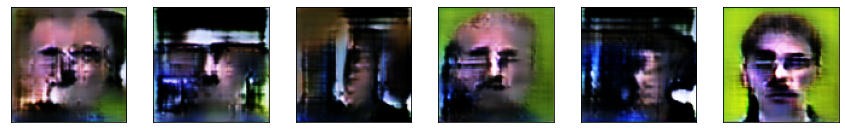

Epoch 50, gen loss=0.6931461095809937,disc loss=1.0064101219177246, 0:00:29.66


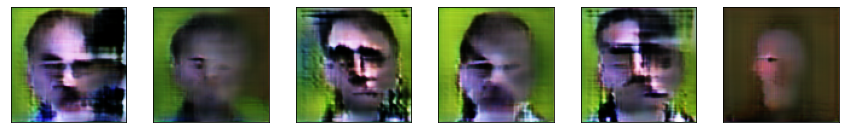

Training time: 0:25:02.98


In [ ]:
train(train_dataset, EPOCHS)

# Генерация одиночной картинки

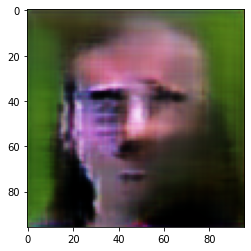

In [ ]:
noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)

plt.imshow((generated_image[0, :, :, :] + 1.0) / 2.0)